# Graphing Data from our final product
### Written by Minh Phan

The first five notebooks demonstrates the process of obtaining and combining data into our final dataset product that we use to feed in our machine learning models. This tutorial, therefore, serves to guide you through some of the fundamental functions you may use while exploring the data.

This tutorial utilizes the [Xarray](https://docs.xarray.dev/en/stable/) library. You can also use the [Zarr](https://zarr.readthedocs.io/en/stable/) library which is specialized in handling this type of dataset. Xarray is more well-known in the Python developer community, hence the preference. It also seamlessly handles conversion with other popular data libraries like Pandas, NumPy, and Dask.

## (Install and) Import necessary libraries

In [1]:
! pip install cmocean

In [2]:
! conda install --channel conda-forge pygmt -y

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 22.11.1
  latest version: 23.7.4

Please update conda by running

    $ conda update -n base -c conda-forge conda

Or to minimize the number of packages updated during conda update use

     conda install conda=23.7.4



# All requested packages already installed.



In [6]:
# Run in terminal
# conda create --name pygmt --channel conda-forge pygmt
# then run
# conda activate pygmt


CommandNotFoundError: Your shell has not been properly configured to use 'conda activate'.
To initialize your shell, run

    $ conda init <SHELL_NAME>

Currently supported shells are:
  - bash
  - fish
  - tcsh
  - xonsh
  - zsh
  - powershell

See 'conda init --help' for more information and options.

IMPORTANT: You may need to close and restart your shell after running 'conda init'.




In [3]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import holoviews as hv
import hvplot.xarray
import cmocean
import cartopy

In [4]:
import pygmt

## Read data

In [5]:
# Change the file path accordingly
ds = xr.open_zarr('/home/jovyan/shared-readwrite/data/INDIAN_OCEAN_025GRID_DAILY.zarr/')

## Slicing data

In [4]:
ds

<xarray.Dataset>
Dimensions:          (time: 8523, lat: 177, lon: 241)
Coordinates:
  * lat              (lat) float32 32.0 31.75 31.5 31.25 ... -11.5 -11.75 -12.0
  * lon              (lon) float32 42.0 42.25 42.5 42.75 ... 101.5 101.8 102.0
  * time             (time) datetime64[ns] 1997-09-01 1997-09-02 ... 2020-12-31
Data variables: (12/14)
    CHL              (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
    CHL_uncertainty  (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
    adt              (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
    air_temp         (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
    direction        (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
    sla              (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
    ...               ...
    u_curr           (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
    u_wind           (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
    ug_curr          (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
    v_curr           (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
    v_wind           (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
    vg_curr          (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
Attributes: (12/17)
    creator_email:              minhphan@uw.edu
    creator_name:               Minh Phan
    creator_type:               person
    date_created:               2023-07-07
    geospatial_lat_max:         32.0
    geospatial_lat_min:         -12.0
    ...                         ...
    geospatial_lon_units:       degrees_east
    source:                     OSCAR, ERA5 Reanalysis, Copernicus Climate Ch...
    summary:                    Daily mean of 0.25 x 0.25 degrees gridded dat...
    time_coverage_end:          2020-12-31T23:59:59
    time_coverage_start:        2000-01-01T00:00:00
    title:                      Climate Data for Coastal Upwelling Machine Le...

We can slice data by the dimensions (latitude, longitude, time) and data variables. 

In [5]:
# slice by latitude
# notice how we specify the range in reverse
ds.sel(lat=slice(0, -12))

<xarray.Dataset>
Dimensions:          (time: 8523, lat: 49, lon: 241)
Coordinates:
  * lat              (lat) float32 0.0 -0.25 -0.5 -0.75 ... -11.5 -11.75 -12.0
  * lon              (lon) float32 42.0 42.25 42.5 42.75 ... 101.5 101.8 102.0
  * time             (time) datetime64[ns] 1997-09-01 1997-09-02 ... 2020-12-31
Data variables: (12/14)
    CHL              (time, lat, lon) float32 dask.array<chunksize=(29, 49, 241), meta=np.ndarray>
    CHL_uncertainty  (time, lat, lon) float32 dask.array<chunksize=(29, 49, 241), meta=np.ndarray>
    adt              (time, lat, lon) float32 dask.array<chunksize=(29, 49, 241), meta=np.ndarray>
    air_temp         (time, lat, lon) float32 dask.array<chunksize=(29, 49, 241), meta=np.ndarray>
    direction        (time, lat, lon) float32 dask.array<chunksize=(29, 49, 241), meta=np.ndarray>
    sla              (time, lat, lon) float32 dask.array<chunksize=(29, 49, 241), meta=np.ndarray>
    ...               ...
    u_curr           (time, lat, lon) float32 dask.array<chunksize=(29, 49, 241), meta=np.ndarray>
    u_wind           (time, lat, lon) float32 dask.array<chunksize=(29, 49, 241), meta=np.ndarray>
    ug_curr          (time, lat, lon) float32 dask.array<chunksize=(29, 49, 241), meta=np.ndarray>
    v_curr           (time, lat, lon) float32 dask.array<chunksize=(29, 49, 241), meta=np.ndarray>
    v_wind           (time, lat, lon) float32 dask.array<chunksize=(29, 49, 241), meta=np.ndarray>
    vg_curr          (time, lat, lon) float32 dask.array<chunksize=(29, 49, 241), meta=np.ndarray>
Attributes: (12/17)
    creator_email:              minhphan@uw.edu
    creator_name:               Minh Phan
    creator_type:               person
    date_created:               2023-07-07
    geospatial_lat_max:         32.0
    geospatial_lat_min:         -12.0
    ...                         ...
    geospatial_lon_units:       degrees_east
    source:                     OSCAR, ERA5 Reanalysis, Copernicus Climate Ch...
    summary:                    Daily mean of 0.25 x 0.25 degrees gridded dat...
    time_coverage_end:          2020-12-31T23:59:59
    time_coverage_start:        2000-01-01T00:00:00
    title:                      Climate Data for Coastal Upwelling Machine Le...

In [6]:
# slice by longitude
ds.sel(lon=slice(42, 45))

<xarray.Dataset>
Dimensions:          (time: 8523, lat: 177, lon: 13)
Coordinates:
  * lat              (lat) float32 32.0 31.75 31.5 31.25 ... -11.5 -11.75 -12.0
  * lon              (lon) float32 42.0 42.25 42.5 42.75 ... 44.5 44.75 45.0
  * time             (time) datetime64[ns] 1997-09-01 1997-09-02 ... 2020-12-31
Data variables: (12/14)
    CHL              (time, lat, lon) float32 dask.array<chunksize=(29, 177, 13), meta=np.ndarray>
    CHL_uncertainty  (time, lat, lon) float32 dask.array<chunksize=(29, 177, 13), meta=np.ndarray>
    adt              (time, lat, lon) float32 dask.array<chunksize=(29, 177, 13), meta=np.ndarray>
    air_temp         (time, lat, lon) float32 dask.array<chunksize=(29, 177, 13), meta=np.ndarray>
    direction        (time, lat, lon) float32 dask.array<chunksize=(29, 177, 13), meta=np.ndarray>
    sla              (time, lat, lon) float32 dask.array<chunksize=(29, 177, 13), meta=np.ndarray>
    ...               ...
    u_curr           (time, lat, lon) float32 dask.array<chunksize=(29, 177, 13), meta=np.ndarray>
    u_wind           (time, lat, lon) float32 dask.array<chunksize=(29, 177, 13), meta=np.ndarray>
    ug_curr          (time, lat, lon) float32 dask.array<chunksize=(29, 177, 13), meta=np.ndarray>
    v_curr           (time, lat, lon) float32 dask.array<chunksize=(29, 177, 13), meta=np.ndarray>
    v_wind           (time, lat, lon) float32 dask.array<chunksize=(29, 177, 13), meta=np.ndarray>
    vg_curr          (time, lat, lon) float32 dask.array<chunksize=(29, 177, 13), meta=np.ndarray>
Attributes: (12/17)
    creator_email:              minhphan@uw.edu
    creator_name:               Minh Phan
    creator_type:               person
    date_created:               2023-07-07
    geospatial_lat_max:         32.0
    geospatial_lat_min:         -12.0
    ...                         ...
    geospatial_lon_units:       degrees_east
    source:                     OSCAR, ERA5 Reanalysis, Copernicus Climate Ch...
    summary:                    Daily mean of 0.25 x 0.25 degrees gridded dat...
    time_coverage_end:          2020-12-31T23:59:59
    time_coverage_start:        2000-01-01T00:00:00
    title:                      Climate Data for Coastal Upwelling Machine Le...

In [7]:
# slice by time
ds.sel(time=slice('1998', '1999'))

<xarray.Dataset>
Dimensions:          (time: 730, lat: 177, lon: 241)
Coordinates:
  * lat              (lat) float32 32.0 31.75 31.5 31.25 ... -11.5 -11.75 -12.0
  * lon              (lon) float32 42.0 42.25 42.5 42.75 ... 101.5 101.8 102.0
  * time             (time) datetime64[ns] 1998-01-01 1998-01-02 ... 1999-12-31
Data variables: (12/14)
    CHL              (time, lat, lon) float32 dask.array<chunksize=(7, 177, 241), meta=np.ndarray>
    CHL_uncertainty  (time, lat, lon) float32 dask.array<chunksize=(7, 177, 241), meta=np.ndarray>
    adt              (time, lat, lon) float32 dask.array<chunksize=(7, 177, 241), meta=np.ndarray>
    air_temp         (time, lat, lon) float32 dask.array<chunksize=(7, 177, 241), meta=np.ndarray>
    direction        (time, lat, lon) float32 dask.array<chunksize=(7, 177, 241), meta=np.ndarray>
    sla              (time, lat, lon) float32 dask.array<chunksize=(7, 177, 241), meta=np.ndarray>
    ...               ...
    u_curr           (time, lat, lon) float32 dask.array<chunksize=(7, 177, 241), meta=np.ndarray>
    u_wind           (time, lat, lon) float32 dask.array<chunksize=(7, 177, 241), meta=np.ndarray>
    ug_curr          (time, lat, lon) float32 dask.array<chunksize=(7, 177, 241), meta=np.ndarray>
    v_curr           (time, lat, lon) float32 dask.array<chunksize=(7, 177, 241), meta=np.ndarray>
    v_wind           (time, lat, lon) float32 dask.array<chunksize=(7, 177, 241), meta=np.ndarray>
    vg_curr          (time, lat, lon) float32 dask.array<chunksize=(7, 177, 241), meta=np.ndarray>
Attributes: (12/17)
    creator_email:              minhphan@uw.edu
    creator_name:               Minh Phan
    creator_type:               person
    date_created:               2023-07-07
    geospatial_lat_max:         32.0
    geospatial_lat_min:         -12.0
    ...                         ...
    geospatial_lon_units:       degrees_east
    source:                     OSCAR, ERA5 Reanalysis, Copernicus Climate Ch...
    summary:                    Daily mean of 0.25 x 0.25 degrees gridded dat...
    time_coverage_end:          2020-12-31T23:59:59
    time_coverage_start:        2000-01-01T00:00:00
    title:                      Climate Data for Coastal Upwelling Machine Le...

In [8]:
# slice by variable
ds[['u_curr', 'u_wind']]

<xarray.Dataset>
Dimensions:  (time: 8523, lat: 177, lon: 241)
Coordinates:
  * lat      (lat) float32 32.0 31.75 31.5 31.25 ... -11.25 -11.5 -11.75 -12.0
  * lon      (lon) float32 42.0 42.25 42.5 42.75 ... 101.2 101.5 101.8 102.0
  * time     (time) datetime64[ns] 1997-09-01 1997-09-02 ... 2020-12-31
Data variables:
    u_curr   (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
    u_wind   (time, lat, lon) float32 dask.array<chunksize=(29, 177, 241), meta=np.ndarray>
Attributes: (12/17)
    creator_email:              minhphan@uw.edu
    creator_name:               Minh Phan
    creator_type:               person
    date_created:               2023-07-07
    geospatial_lat_max:         32.0
    geospatial_lat_min:         -12.0
    ...                         ...
    geospatial_lon_units:       degrees_east
    source:                     OSCAR, ERA5 Reanalysis, Copernicus Climate Ch...
    summary:                    Daily mean of 0.25 x 0.25 degrees gridded dat...
    time_coverage_end:          2020-12-31T23:59:59
    time_coverage_start:        2000-01-01T00:00:00
    title:                      Climate Data for Coastal Upwelling Machine Le...

In [9]:
# combine multiple slicing options all at once
ds[['u_curr', 'u_wind']].sel(time=slice('1998', '1999'), 
                             lat=slice(0, -12), 
                             lon=slice(42, 45))

<xarray.Dataset>
Dimensions:  (time: 730, lat: 49, lon: 13)
Coordinates:
  * lat      (lat) float32 0.0 -0.25 -0.5 -0.75 ... -11.25 -11.5 -11.75 -12.0
  * lon      (lon) float32 42.0 42.25 42.5 42.75 43.0 ... 44.25 44.5 44.75 45.0
  * time     (time) datetime64[ns] 1998-01-01 1998-01-02 ... 1999-12-31
Data variables:
    u_curr   (time, lat, lon) float32 dask.array<chunksize=(7, 49, 13), meta=np.ndarray>
    u_wind   (time, lat, lon) float32 dask.array<chunksize=(7, 49, 13), meta=np.ndarray>
Attributes: (12/17)
    creator_email:              minhphan@uw.edu
    creator_name:               Minh Phan
    creator_type:               person
    date_created:               2023-07-07
    geospatial_lat_max:         32.0
    geospatial_lat_min:         -12.0
    ...                         ...
    geospatial_lon_units:       degrees_east
    source:                     OSCAR, ERA5 Reanalysis, Copernicus Climate Ch...
    summary:                    Daily mean of 0.25 x 0.25 degrees gridded dat...
    time_coverage_end:          2020-12-31T23:59:59
    time_coverage_start:        2000-01-01T00:00:00
    title:                      Climate Data for Coastal Upwelling Machine Le...

## Basic data graphing

We can also graph the data right from slicing, especially heatmaps from 2D arrays, or line charts. This is especially useful when we want to inspect elements on the go.

In [7]:
# make sure that the array you slice for a heatmap visualization is a 2D array
heatmap_arr = ds['wind_speed'].sel(time='2000-01-02')
heatmap_arr

<xarray.DataArray 'wind_speed' (lat: 177, lon: 241)>
dask.array<getitem, shape=(177, 241), dtype=float32, chunksize=(177, 241), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 32.0 31.75 31.5 31.25 ... -11.25 -11.5 -11.75 -12.0
  * lon      (lon) float32 42.0 42.25 42.5 42.75 ... 101.2 101.5 101.8 102.0
    time     datetime64[ns] 2000-01-02
Attributes:
    long_name:  10 metre absolute speed
    units:      m s**-1

### 2D array graphing with matplotlib
By default, graphing arrays with Xarray is done using [matplotlib](https://docs.xarray.dev/en/stable/user-guide/plotting.html).

For 2D arrays we have multiple options to choose for our graphs

#### Heatmaps

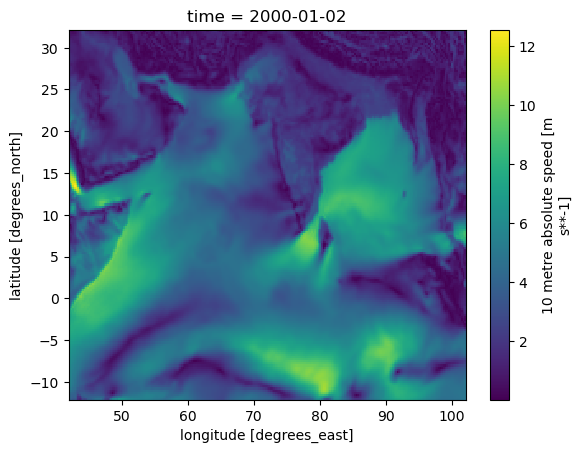

In [8]:
heatmap_arr.plot.imshow()

#### Contour maps

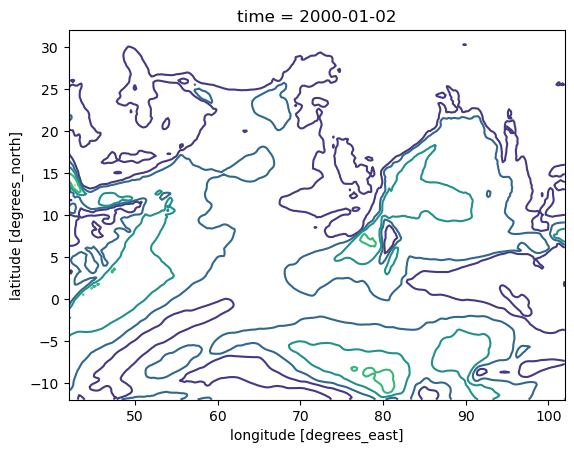

In [9]:
# contour map with no filling
heatmap_arr.plot.contour()

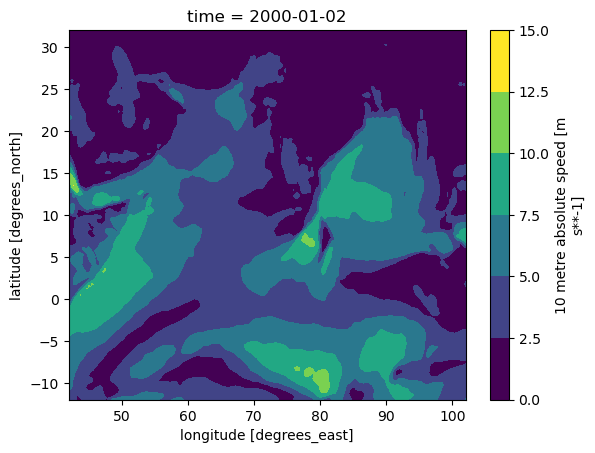

In [10]:
# contour map with color filling
heatmap_arr.plot.contourf()

#### Surface plot

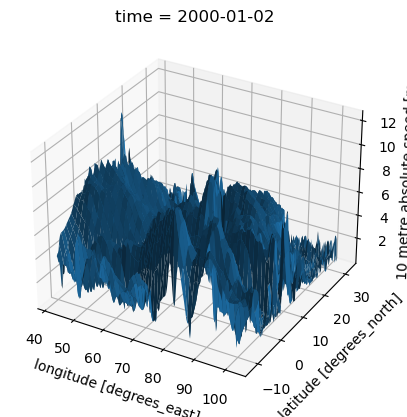

In [11]:
heatmap_arr.plot.surface()

### 1D array graphing with Matplotlib

#### Line plots

We can also plot line graphs if our data is presented in 1D arrays. For the example below, we average our wind speed over the whole area and plot it over time. Matplotlib automatically infers what graph to create if you don't explicitly call which one to. This piece of code below is a demonstration:

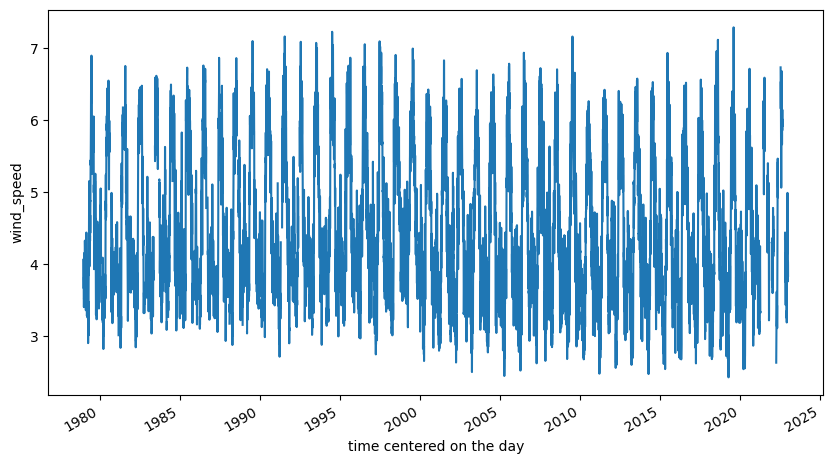

In [12]:
ds['wind_speed'].mean(dim=['lat', 'lon']).plot(figsize=(10, 5))

We can add in parameters to customize our graphs, as additional arguments are passed to the underlying matplotlib `plot()` function.

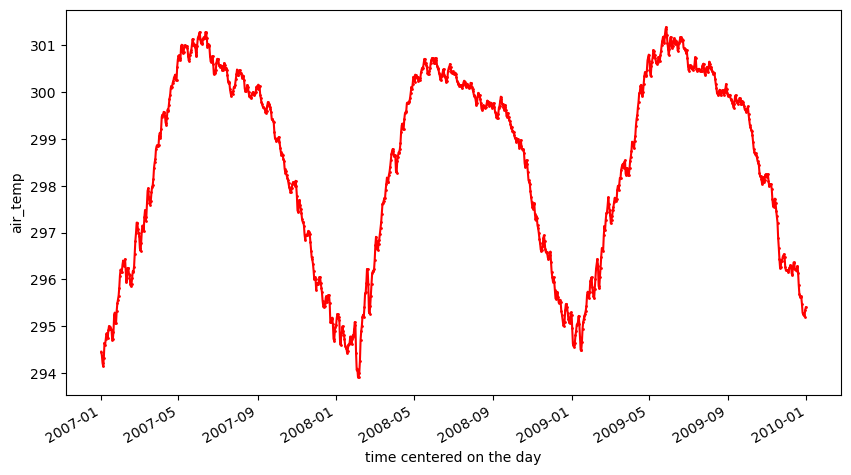

In [13]:
ds['air_temp'].mean(dim=['lat', 'lon']).sel(time=slice('2007', '2009')).plot.line('r-o', figsize=(10,5), markersize=1)

#### Histogram

Text(0.5, 1.0, 'Daily average wind direction distribution over covered area (1979-2022)')

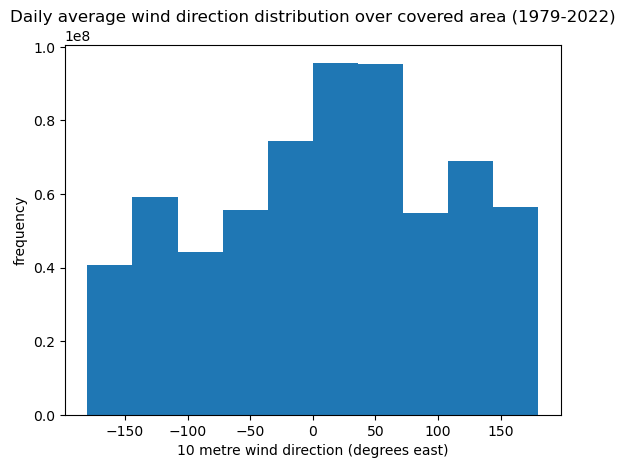

In [16]:
# creating a new Axe object if there is no currently
# available one
ax = plt.gca() 
ds['wind_dir'].plot.hist(ax = ax)
ax.set_xlabel('10 metre wind direction (degrees east)')
ax.set_ylabel('frequency')
ax.set_title('Daily average wind direction distribution over covered area (1979-2022)')

### Graphing with holoviews
Xarray also support graphing using [holoviews](https://holoviews.org/) if you want interactive visualizations.

In [17]:
# scroll along the axes to stretch the graph
heatmap_arr.hvplot().options(cmap='bgy', width=600, height=500)

:Image   [lon,lat]   (wind_speed)

## Maps

Sometimes we want to identify areas in which our data may behave differently. One of the best ways to do this is to create maps.

### Coastline mapping
Coastlines can help us separate land and ocean area. We can plot the coastline for our region of interest without using any data.

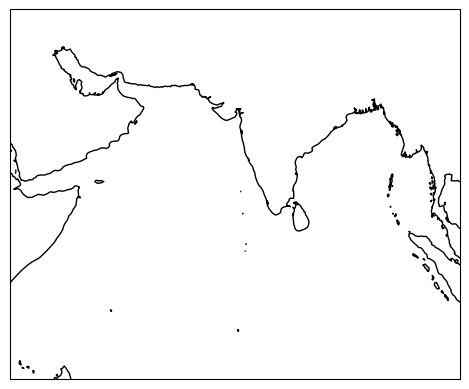

In [18]:
geo_axes = plt.axes(projection=cartopy.crs.PlateCarree())
# add stock image
# geo_axes.stock_img()
geo_axes.set_extent([42, 102, -12, 32])
geo_axes.coastlines()

We can also apply the coastline onto our data. The example below shows a heatmap with the coastline drawn on top of it

In [19]:
topo = xr.open_dataset('/home/jovyan/shared-readwrite/data/INDIAN_OCEAN_HQ_TOPO.nc')

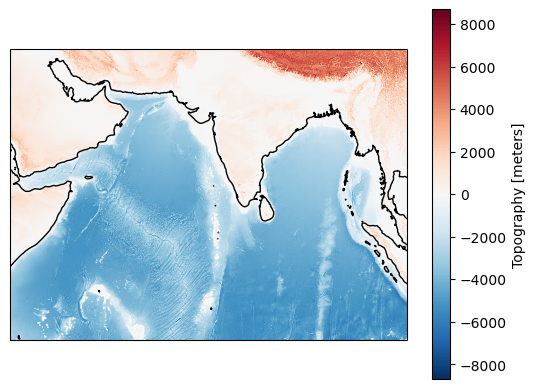

In [20]:
fig, ax = plt.subplots(subplot_kw=dict(projection=cartopy.crs.PlateCarree()))
topo.topo.plot.imshow(ax=ax)
ax.add_feature(cartopy.feature.COASTLINE)

### Topography mapping

We also have a topography dataset that spans the same grid as our final dataset. At the moment of writing this moment, this dataset has not been incoporated into the latter one yet, as you have seen earlier in this notebook that we have to import it separately.

We can use this dataset to visualize the topography through contour maps.

In [8]:
topo

<xarray.Dataset>
Dimensions:    (latitude: 5281, longitude: 7201)
Coordinates:
  * latitude   (latitude) float64 32.0 31.99 31.98 31.98 ... -11.98 -11.99 -12.0
  * longitude  (longitude) float64 42.0 42.01 42.02 42.03 ... 102.0 102.0 102.0
Data variables:
    topo       (latitude, longitude) float32 349.0 352.0 ... -3.727e+03

/srv/conda/envs/notebook/lib/python3.9/site-packages/xarray/plot/dataarray_plot.py:2141: UserWarning: The following kwargs were not used by contour: 'label'
  primitive = ax.contourf(x, y, z, **kwargs)


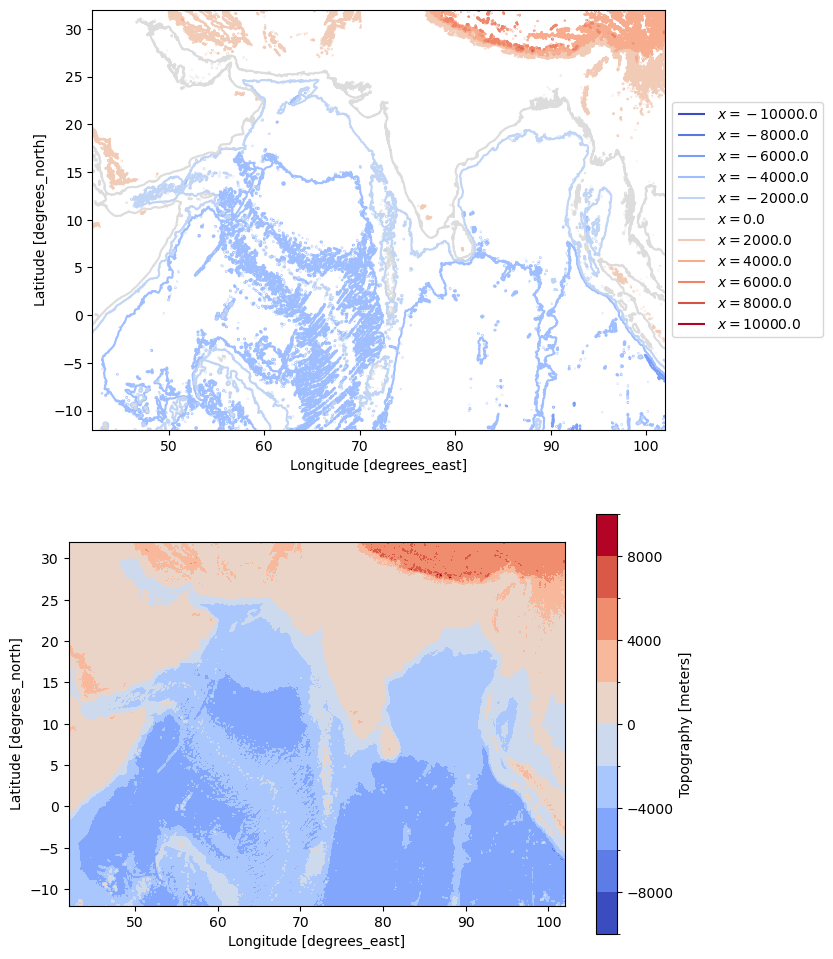

In [22]:
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(8, 12))
topo_contour = topo.topo.plot.contour(levels=12, ax=ax1, cmap='coolwarm')
topo_contourf = topo.topo.plot.contourf(levels=12, ax=ax2, cmap='coolwarm', label='')
# add label in line
# ax.clabel(topo_contour, inline=1, fontsize=10)

hue1, color1 = topo_contour.legend_elements()
hue2, color2 = topo_contourf.legend_elements()
ax1.legend(hue1, color1, loc='center left', bbox_to_anchor=(1, 0.5))
ax1.set_aspect('equal')
ax2.set_aspect('equal')
# ax2.get_legend().set_visible(False)

Exporting the contour lines to graph on other datasets:

In [23]:
# extract lines from contour paths
lines = []
for contour_path in topo_contour.collections:
    for path in contour_path.get_paths():
        lines.extend(path.to_polygons())

In [24]:
len(lines)

12327

We want to graph the topography lines on top of this heatmap. Can we do this with matplotlib?

Let's take a look of the contour lines generated from `matplotlib.pyplot.contour()` function: it returned a list of PathCollection objects containing elevent different contour types based on elevation (each with a different color). Each elevation has multiple "lines" as each of the line denotes an elevation mark.

In [17]:
topo_contour.collections

<a list of 11 PathCollection objects>

In [22]:
len(topo_contour.collections[0].get_paths())

0

In [23]:
len(topo_contour.collections[2].get_paths())

30

In the example below, we graph the contour lines back onto the original contour maps.

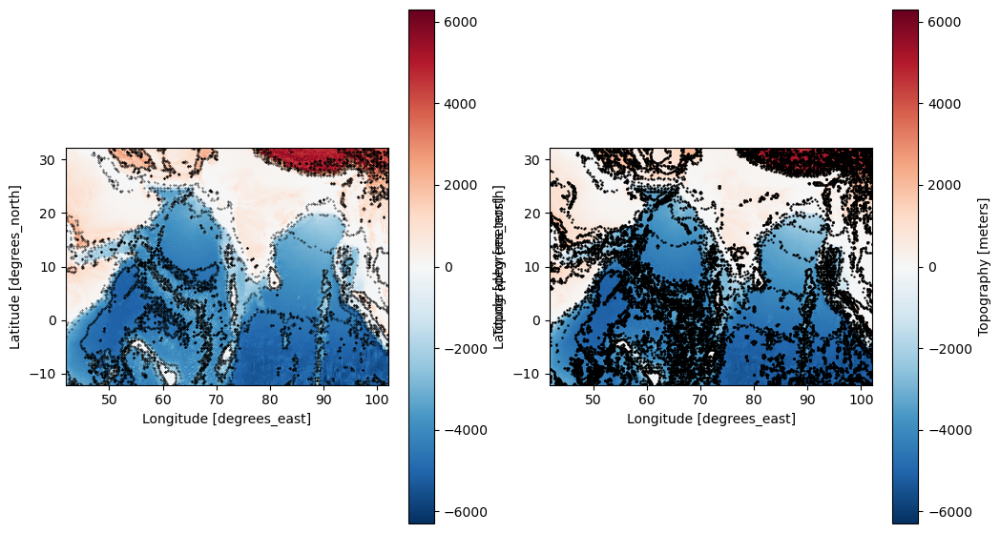

In [96]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 7))
topo.topo.plot.imshow(ax=ax1)
for contour in topo_contour.collections[2:9]:
    for path in contour.get_paths():
        for line in path.to_polygons():
            ax1.scatter(line[:,0], line[:, 1], color='black', s=0.1) # graph some of the contours (as dots)

topo.topo.plot.imshow(ax=ax2)
for line in lines:
    ax2.scatter(line[:,0], line[:, 1], color='black', s=0.5) # graph all contours (as dots)
    
ax1.set_aspect('equal')
ax2.set_aspect('equal')

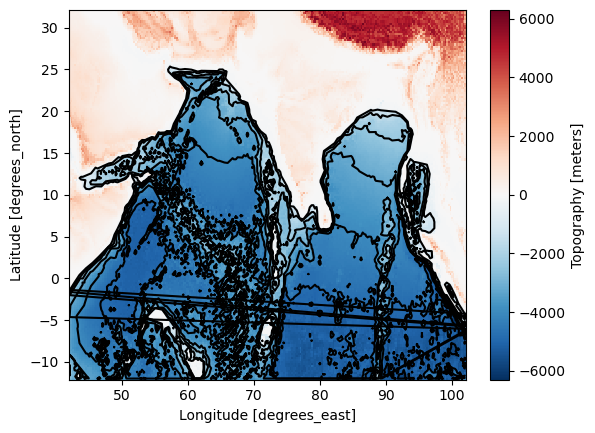

In [38]:
# very weird lines
ax = plt.gca()
topo.topo.plot.imshow(ax=ax)
for line in lines[:1200]: # there is an order of the lines sorted by topography height
    ax.plot(line[:,0], line[:, 1], color='black', markersize=0.1)

### Creating topography contour maps with pygmt

Because of the weird lines caused by the connection of the open-ended paths, we want to experiment with some other packages.

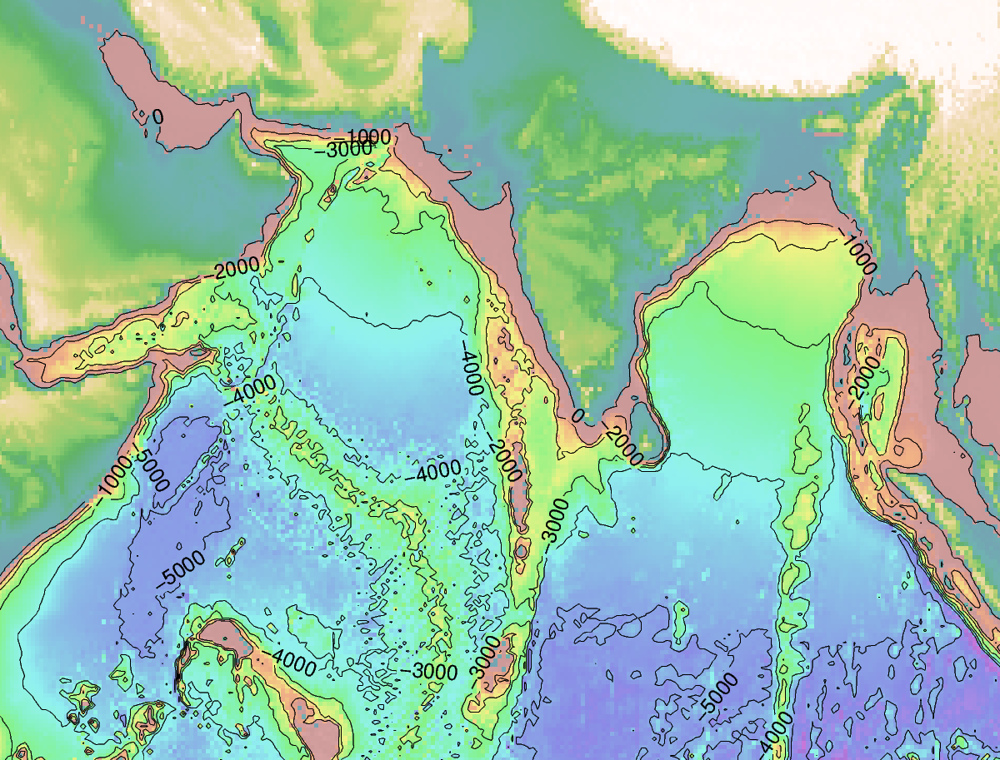

In [128]:
# Load Earth relief grids (topography and bathymetry) in various resolutions.
# get contour grid
grid = pygmt.datasets.load_earth_relief(resolution="15m", region=[42, 102, -12, 32])
fig = pygmt.Figure()
# add the heatmap first
fig.grdimage(topo.topo, region='42/102/-12/32', cmap='topo', projection='M4i') # mercator projection
# and then the contour map on top of it
fig.grdcontour(grid=grid,
              annotation='1000+f6p', # font 6p
              interval=1000,
              limit=[-5000, 0],
              projection='M4i',
              pen="a0.15p") # 0.15 point
fig.show()

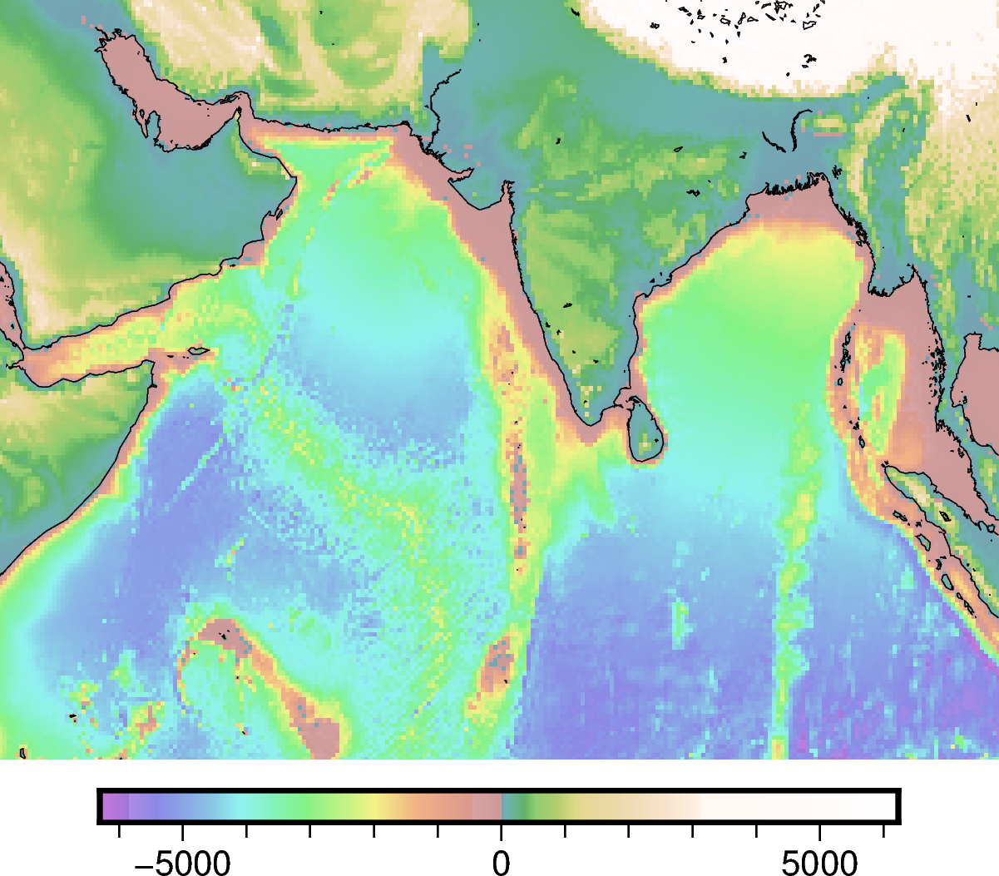

In [130]:
# coastline only
fig2 = pygmt.Figure()
fig2.grdimage(topo.topo, region='42/102/-12/32', cmap='topo', projection='M4i')
fig2.coast(
    region='42/102/-12/32',
    projection='M4i',
    shorelines=True
)
fig2.colorbar()
fig2.show()

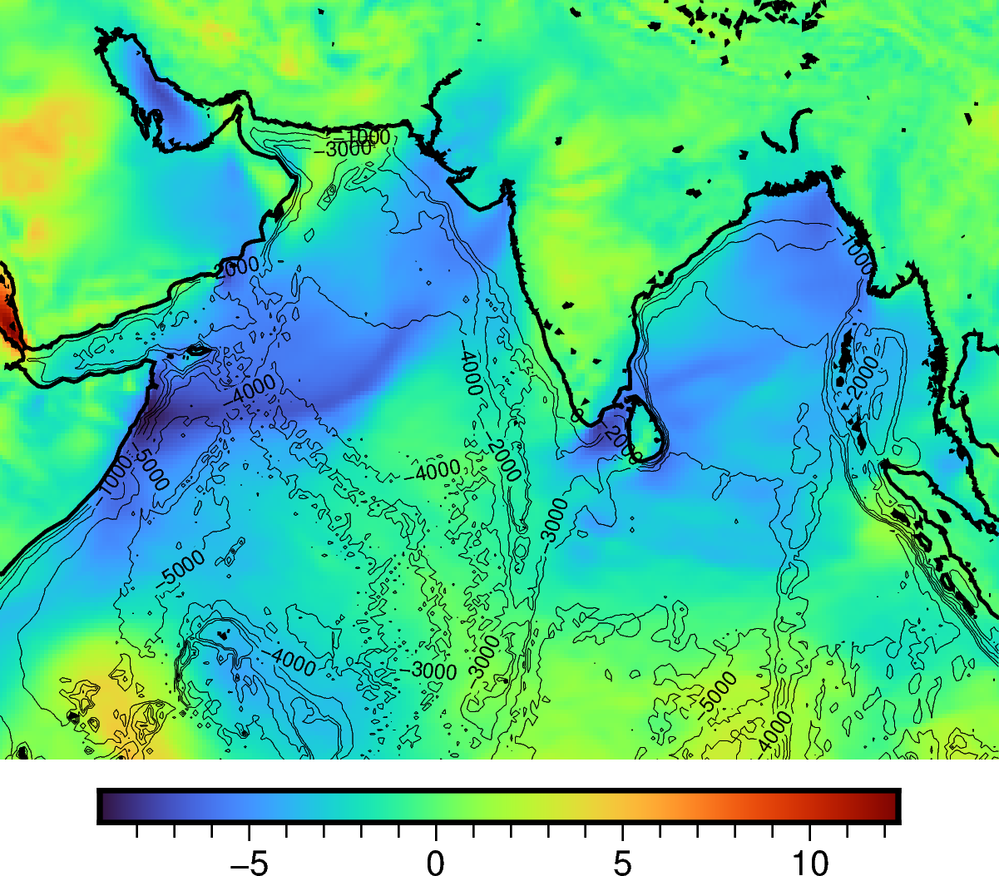

In [18]:
# wind direction
grid = pygmt.datasets.load_earth_relief(resolution="15m", region=[42, 102, -12, 32])

fig3 = pygmt.Figure()
fig3.grdimage(ds.v_wind.isel(time=0), region='42/102/-12/32', projection='M4i')
fig3.grdcontour(grid=grid,
              annotation='1000+f6p', # font 6p
              interval=1000, # every 1000m elevation
              limit=[-5000, 0],
              projection='M4i',
              pen="a0.15p") # 0.15 point
fig3.coast(
    region='42/102/-12/32',
    projection='M4i',
    shorelines="1p,black,solid"
)
fig3.colorbar()
fig3.show()

In [ ]:
# wind direction
fig3 = pygmt.Figure()
fig3.grdimage(ds.direction.isel(time=0), region='42/102/-12/32', projection='M4i')
fig3.coast(
    region='42/102/-12/32',
    projection='M4i',
    shorelines=True
)
fig3.colorbar()
fig3.show()

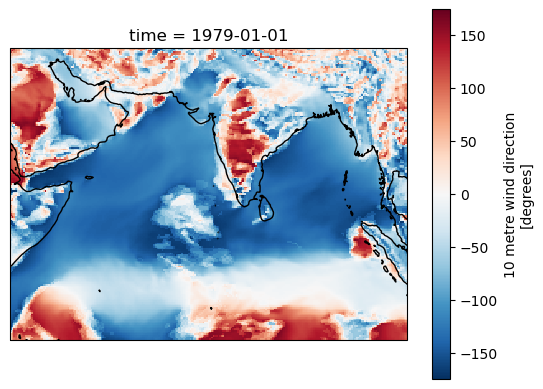

In [27]:
fig, ax = plt.subplots(subplot_kw=dict(projection=cartopy.crs.PlateCarree()))
ds.wind_dir.isel(time=0).plot.imshow(ax=ax)
ax.set_aspect('equal')
ax.add_feature(cartopy.feature.COASTLINE)